In [1]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler

import sklearn
import sklearn.model_selection
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import optimizers



from sklearn.metrics import mean_squared_error




In [51]:
def train_test_monthly(df, train_size = 0.8):
    train = []
    test = []

    for i in df.groupby(df.index.month):
        index = round(len(i[1])*train_size)
        train.append(i[1].iloc[:index,:])
        test.append(i[1].iloc[index:,:])
        
    train = pd.concat(train)
    test = pd.concat(test)
    return train, test

In [3]:
def prepare_forecasting_df(df, timestamp_column_name):

    #TODO: convert to local timezone
    df.dropna(inplace = True)
    df = df.reset_index()
    df = df[~df[timestamp_column_name].duplicated()]
    df = df.set_index(timestamp_column_name)
    return df

In [50]:
def rmse_(df_test):

    y = df_test.iloc[:,:1]
    mean = y.mean()

    rmse_values = {}

    for i in range(len(df_test.columns)-1):
        y_hat = df_test.iloc[:,i+1]


        rmse =  mean_squared_error(y, y_hat, squared=False)
        rmse_values[y_hat.name] = rmse, round(rmse/mean, 2)
    return rmse_values

In [5]:
def plot_loss(history):

  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 10])
  plt.xlabel('Epoch')
  plt.ylabel('Error [MPG]')
  plt.legend()
  plt.grid(True)

In [133]:
df = pd.read_csv("/Users/nikolaushouben/Library/Mobile Documents/com~apple~CloudDocs/PhD/Other_Research/Hackathon/feature_engineering_training_data_cleaned_with_features.csv", index_col= "timestamp", parse_dates=True)
#df = df.iloc[:,:7]
df = df[['E Morley Main', 'Wager', 'MERL Archive', 'Tesla',
       'ssrd', 'speed', 'direction']]





In [134]:
df.fillna(0, inplace=True)
df[df["ssrd"]<0.1]["ssrd"] = 0

scaler = MinMaxScaler()

df_scaled = df
df_scaled[list(df_scaled.columns)] = scaler.fit_transform(df_scaled[list(df_scaled.columns)])

df_scaled = df_scaled[df_scaled["ssrd"] > 0]
df_scaled.loc[df_scaled["E Morley Main"] == 0, "ssrd"] = 0

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


In [135]:
df_scaled

,E Morley Main,Wager,MERL Archive,Tesla,ssrd,speed,direction
timestamp,,,,,,,
2020-06-01 05:30:00,0.083527,0.12500,0.039727,0.036212,0.109078,0.232074,0.203513
2020-06-01 06:00:00,0.148492,0.21990,0.113697,0.043868,0.175035,0.227204,0.198521
2020-06-01 06:30:00,0.213457,0.30000,0.227059,0.080611,0.260509,0.221619,0.198123
2020-06-01 07:00:00,0.285383,0.40000,0.315130,0.240719,0.345983,0.216034,0.197724
2020-06-01 07:30:00,0.387471,0.49025,0.402641,0.347151,0.436133,0.214496,0.205339
...,...,...,...,...,...,...,...
2021-05-31 19:00:00,0.076566,0.05975,0.087847,0.037039,0.180176,0.461406,0.263046
2021-05-31 19:30:00,0.032483,0.03010,0.043308,0.017979,0.113815,0.445782,0.263222
2021-05-31 20:00:00,0.009281,0.01015,0.015779,0.000000,0.047455,0.430159,0.263399


In [136]:
cut_labels = [0,1,0,-1,0]
cut_bins = [0, 0.3, 0.4, 0.8, 0.9,1]


df_scaled["dummies"] = pd.cut(df_scaled["direction"], labels=cut_labels, bins=cut_bins, ordered=False)

df_scaled = df_scaled.loc[df_scaled["dummies"] != 0]


<ipython-input-136-460db2748d3d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled["dummies"] = pd.cut(df_scaled["direction"], labels=cut_labels, bins=cut_bins, ordered=False)


In [137]:
df_scaled

,E Morley Main,Wager,MERL Archive,Tesla,ssrd,speed,direction,dummies
timestamp,,,,,,,,
2020-06-01 12:00:00,0.851508,0.81485,0.896822,0.998236,0.974654,0.151276,0.306365,1
2020-06-01 12:30:00,0.665893,0.65510,0.852395,0.707268,0.972913,0.144398,0.324440,1
2020-06-01 13:00:00,0.802784,0.78985,0.831244,0.884798,0.971171,0.137520,0.342515,1
2020-06-01 13:30:00,0.832947,0.81525,0.730416,0.869452,0.954356,0.133484,0.355284,1
2020-06-01 14:00:00,0.832947,0.77970,0.667525,0.682713,0.937542,0.129447,0.368052,1
...,...,...,...,...,...,...,...,...
2021-05-31 06:00:00,0.046404,0.05000,0.049799,0.055778,0.170948,0.529729,0.309422,1
2021-05-31 06:30:00,0.074246,0.07500,0.078671,0.085338,0.185393,0.528534,0.308312,1
2021-05-31 07:00:00,0.104408,0.10510,0.105304,0.138398,0.199839,0.527339,0.307201,1


# Basic 30 min lag

In [138]:
# train a model for each windspeed

# take the wind speed forecast -> select model (specific lag 5,10,15,30) -> 

In [139]:
df_scaled.iloc[:,1:-4] = df_scaled.iloc[:,1:-4].shift(1)
df_scaled.dropna(inplace=True)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1754: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, val, pi)
<ipython-input-139-b7264c25ef8f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled.dropna(inplace=True)


In [140]:
df_scaled

,E Morley Main,Wager,MERL Archive,Tesla,ssrd,speed,direction,dummies
timestamp,,,,,,,,
2020-06-01 12:30:00,0.665893,0.81485,0.896822,0.998236,0.972913,0.144398,0.324440,1
2020-06-01 13:00:00,0.802784,0.65510,0.852395,0.707268,0.971171,0.137520,0.342515,1
2020-06-01 13:30:00,0.832947,0.78985,0.831244,0.884798,0.954356,0.133484,0.355284,1
2020-06-01 14:00:00,0.832947,0.81525,0.730416,0.869452,0.937542,0.129447,0.368052,1
2020-06-01 14:30:00,0.733179,0.77970,0.667525,0.682713,0.893028,0.120490,0.374367,1
...,...,...,...,...,...,...,...,...
2021-05-31 06:00:00,0.046404,0.02500,0.030551,0.037832,0.170948,0.529729,0.309422,1
2021-05-31 06:30:00,0.074246,0.05000,0.049799,0.055778,0.185393,0.528534,0.308312,1
2021-05-31 07:00:00,0.104408,0.07500,0.078671,0.085338,0.199839,0.527339,0.307201,1


In [141]:
train, test = train_test_monthly(df_scaled)

# a) Benchmark Model (SSRD Only)

In [142]:
train_X_a = train[["ssrd"]]
train_y_a = train[["E Morley Main"]]

test_X_a = test[["ssrd"]]
test_y_a = test[["E Morley Main"]]

In [143]:
model = RandomForestRegressor()
model.fit(train_X_a, train_y_a)
test_y_a["predicted_RF"] = model.predict(test_X_a)

<ipython-input-143-5ad4bd680848>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_a, train_y_a)
<ipython-input-143-5ad4bd680848>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_RF"] = model.predict(test_X_a)


In [144]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_a, train_y_a)
test_y_a["predicted_DT"] = ada_clf.predict(test_X_a)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<ipython-input-144-f5469d1e6f05>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_DT"] = ada_clf.predict(test_X_a)


In [145]:
def build_and_compile_model(nodes):
  model = Sequential([
      layers.Dense(nodes, activation='elu'),
      layers.Dense(round(nodes*0.6), activation='elu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=optimizers.Adam(0.001))
  return model

In [146]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_a, train_y_a,
    validation_split=0.2,
    verbose=0, epochs=100)



In [147]:
#plot_loss(history)
x = dnn_model.evaluate(train_X_a, train_y_a, verbose=0)

test_y_a["predicted_MLP"] = dnn_model.predict(test_X_a).flatten()

<ipython-input-147-60d56862434e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_MLP"] = dnn_model.predict(test_X_a).flatten()


In [148]:
test_y_a

,E Morley Main,predicted_RF,predicted_DT,predicted_MLP
timestamp,,,,
2021-01-27 08:30:00,0.000000,0.000000,0.046404,-0.010081
2021-01-27 09:00:00,0.004640,0.013527,0.048724,0.014035
2021-01-27 09:30:00,0.037123,0.036450,0.076566,0.032540
2021-01-27 10:00:00,0.034803,0.044037,0.076566,0.051661
2021-01-27 12:30:00,0.055684,0.064780,0.090487,0.063065
...,...,...,...,...
2020-12-28 11:30:00,0.074246,0.078631,0.099768,0.112018
2020-12-28 12:00:00,0.099768,0.062204,0.127610,0.085349
2020-12-28 12:30:00,0.129930,0.171647,0.127610,0.108259


In [149]:
rmse_(test_y_a)

{'predicted_RF': (0.16559591161892392,
  E Morley Main    0.61
  dtype: float64),
 'predicted_DT': (0.17076394967361336,
  E Morley Main    0.63
  dtype: float64),
 'predicted_MLP': (0.14895554249816917,
  E Morley Main    0.55
  dtype: float64)}

# b) Blackbox model with other station Lags + SSRD (without wind)

In [150]:
train_X_b = train[["ssrd", 'Wager', 'MERL Archive',
       'Tesla']]
       
train_y_b = train[["E Morley Main"]]

test_X_b = test[["ssrd", 'Wager', 'MERL Archive',"Tesla"]]
test_y_b = test[["E Morley Main"]]

In [151]:
model = RandomForestRegressor()
model.fit(train_X_b, train_y_b)
test_y_b["predicted_RF"] = model.predict(test_X_b)

<ipython-input-151-30a1ab3072f7>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_b, train_y_b)
<ipython-input-151-30a1ab3072f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_RF"] = model.predict(test_X_b)


In [152]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_b, train_y_b)
test_y_b["predicted_DT"] = ada_clf.predict(test_X_b)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<ipython-input-152-305a51609511>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_DT"] = ada_clf.predict(test_X_b)


In [153]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_b, train_y_b,
    validation_split=0.2,
    verbose=0, epochs=100)


In [154]:
#plot_loss(history)
x = dnn_model.evaluate(train_X_b, train_y_b, verbose=0)

test_y_b["predicted_MLP"] = dnn_model.predict(test_X_b).flatten()

<ipython-input-154-bfc9f349cc95>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_MLP"] = dnn_model.predict(test_X_b).flatten()


In [155]:
rmse_(test_y_b)

{'predicted_RF': (0.11097213676979688,
  E Morley Main    0.41
  dtype: float64),
 'predicted_DT': (0.11895124283484958,
  E Morley Main    0.44
  dtype: float64),
 'predicted_MLP': (0.12214171312791346,
  E Morley Main    0.45
  dtype: float64)}

# c) Same station lags + SSRD

In [156]:
df_c = df_scaled[["E Morley Main", "ssrd"]]

In [157]:
df_c["lag_30"] = df_c["E Morley Main"].shift(1)
df_c.dropna(inplace=True)

<ipython-input-157-20d5d81e4c59>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c["lag_30"] = df_c["E Morley Main"].shift(1)
<ipython-input-157-20d5d81e4c59>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c.dropna(inplace=True)


In [158]:
train_c, test_c = train_test_monthly(df_c)

In [159]:
train_X_c = train_c[["ssrd", "lag_30"]]
train_y_c = train_c[["E Morley Main"]]

test_X_c = test_c[["ssrd", "lag_30"]]
test_y_c = test_c[["E Morley Main"]]

In [160]:
model = RandomForestRegressor()
model.fit(train_X_c, train_y_c)
test_y_c["predicted_RF"] = model.predict(test_X_c)

<ipython-input-160-68feee4aed42>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_c, train_y_c)
<ipython-input-160-68feee4aed42>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_c["predicted_RF"] = model.predict(test_X_c)


In [161]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_c, train_y_c)
test_y_c["predicted_DT"] = ada_clf.predict(test_X_c)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [162]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_c, train_y_c,
    validation_split=0.2,
    verbose=0, epochs=100)


#plot_loss(history)
x = dnn_model.evaluate(train_X_c, train_y_c, verbose=0)

test_y_c["predicted_MLP"] = dnn_model.predict(test_X_c).flatten()

In [163]:
rmse_(test_y_c)

{'predicted_RF': (0.1325342645186615,
  E Morley Main    0.49
  dtype: float64),
 'predicted_DT': (0.14055769092648815,
  E Morley Main    0.52
  dtype: float64),
 'predicted_MLP': (0.12844299571409573,
  E Morley Main    0.48
  dtype: float64)}

# d) Blackbox model with wind variables 

In [165]:
train_X_d = train.iloc[:,1:-1]
train_y_d = train.iloc[:,:1]

test_X_d = test.iloc[:,1:-1]
test_y_d = test.iloc[:,:1]

In [169]:
model = RandomForestRegressor()
model.fit(train_X_d, train_y_d)
test_y_d["predicted_RF"] = model.predict(test_X_d)

<ipython-input-169-615573d135e5>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_d, train_y_d)


In [170]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_d, train_y_d)
test_y_d["predicted_DT"] = ada_clf.predict(test_X_d)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [171]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_d, train_y_d,
    validation_split=0.2,
    verbose=0, epochs=100)


#plot_loss(history)
x = dnn_model.evaluate(train_X_d, train_y_d, verbose=0)

test_y_d["predicted_MLP"] = dnn_model.predict(test_X_d).flatten()

In [172]:
rmse_(test_y_d)

{'predicted_RF': (0.11181475045241186,
  E Morley Main    0.42
  dtype: float64),
 'predicted_DT': (0.11133958350619434,
  E Morley Main    0.41
  dtype: float64),
 'predicted_MLP': (0.12071122596166002,
  E Morley Main    0.45
  dtype: float64)}

# e) Manual Selection

In [173]:
df_manual = df_scaled

<ipython-input-63-aa35fc755f1e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_manual["dummies"] = pd.cut(df_manual["direction"], labels=cut_labels, bins=cut_bins, ordered=False)


In [174]:
df_manual.loc[df_manual["dummies"] == 1, ["Wager", "Tesla"]] = 0
df_manual.loc[df_manual["dummies"] == -1, ["MERL Archive"]] = 0
df_manual.loc[df_manual["dummies"] == 0, ["Wager", "Tesla", "MERL Archive"]] = 0

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [175]:
train_e, test_e = train_test_monthly(df_manual)

In [176]:
train_X_e = train_e.iloc[:,1:-2]
train_y_e = train_e.iloc[:,:1]

test_X_e = test_e.iloc[:,1:-2]
test_y_e = test_e.iloc[:,:1]

In [177]:
train_X_e

,Wager,MERL Archive,Tesla,ssrd,speed
timestamp,,,,,
2021-01-02 13:30:00,0.03515,0.0,0.000000,0.601955,0.091604
2021-01-02 14:00:00,0.21485,0.0,0.124285,0.506650,0.089450
2021-01-02 14:30:00,0.10510,0.0,0.088495,0.405105,0.082178
2021-01-02 15:00:00,0.07500,0.0,0.052435,0.303560,0.074905
2021-01-02 15:30:00,0.05000,0.0,0.018486,0.194219,0.056777
...,...,...,...,...,...
2020-12-12 10:00:00,0.00000,0.0,0.000000,0.155651,0.088144
2020-12-12 14:00:00,0.00000,0.0,0.000000,0.398749,0.124584
2020-12-12 14:30:00,0.00000,0.0,0.000000,0.347980,0.127669


In [178]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_e, train_y_e,
    validation_split=0.2,
    verbose=0, epochs=100)


#plot_loss(history)
x = dnn_model.evaluate(train_X_e, train_y_e, verbose=0)

test_y_e["predicted_MLP"] = dnn_model.predict(test_X_e).flatten()

# Comparing the MLP of each Model

In [179]:
df_compare = pd.DataFrame()

df_compare["true_values"] = test_y_a["E Morley Main"]

df_compare["only_ssrd"] = test_y_a["predicted_MLP"]

df_compare["ssrd_+_other_station_lags"] = test_y_b["predicted_MLP"]

df_compare["ssrd_+_own_station_lags"] = test_y_c["predicted_MLP"]

df_compare["ssrd_+_other_station_lags_+_wind"] = test_y_d["predicted_MLP"]

df_compare["station_selector"] = test_y_e["predicted_MLP"]

df_compare.dropna(inplace=True)

In [180]:
rmse_(df_compare)

{'only_ssrd': (0.14895554249816917,
  true_values    0.55
  dtype: float64),
 'ssrd_+_other_station_lags': (0.12214171312791346,
  true_values    0.45
  dtype: float64),
 'ssrd_+_own_station_lags': (0.12844299571409573,
  true_values    0.48
  dtype: float64),
 'ssrd_+_other_station_lags_+_wind': (0.12071122596166002,
  true_values    0.45
  dtype: float64),
 'station_selector': (0.13311008926960854,
  true_values    0.49
  dtype: float64)}

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


2020-06-16    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-17       AxesSubplot(0.125,0.2;0.775x0.68)
2020-06-24    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-25    AxesSubplot(0.125,0.125;0.775x0.755)
2020-07-30    AxesSubplot(0.125,0.125;0.775x0.755)
2020-08-17       AxesSubplot(0.125,0.2;0.775x0.68)
2020-08-19       AxesSubplot(0.125,0.2;0.775x0.68)
2020-08-23    AxesSubplot(0.125,0.125;0.775x0.755)
2020-08-26    AxesSubplot(0.125,0.125;0.775x0.755)
2020-08-28    AxesSubplot(0.125,0.125;0.775x0.755)
2020-09-19    AxesSubplot(0.125,0.125;0.775x0.755)
2020-09-20    AxesSubplot(0.125,0.125;0.775x0.755)
2020-09-21    AxesSubplot(0.125,0.125;0.775x0.755)
2020-10-18       AxesSubplot(0.125,0.2;0.775x0.68)
2020-11-28       AxesSubplot(0.125,0.2;0.775x0.68)
2020-11-30    AxesSubplot(0.125,0.125;0.775x0.755)
2020-12-12       AxesSubplot(0.125,0.2;0.775x0.68)
2020-12-23       AxesSubplot(0.125,0.2;0.775x0.68)
2020-12-28    AxesSubplot(0.125,0.125;0.775x0.755)
2021-01-27       AxesSubplot(0.

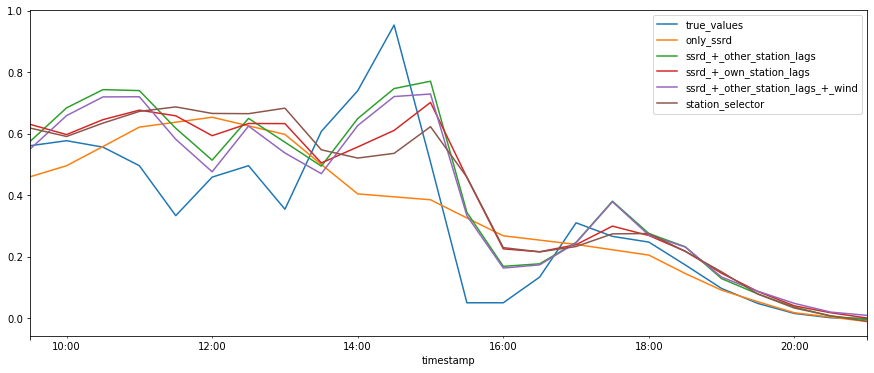

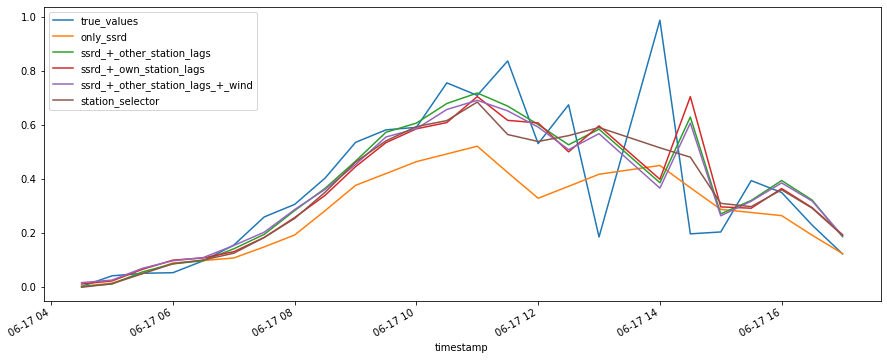

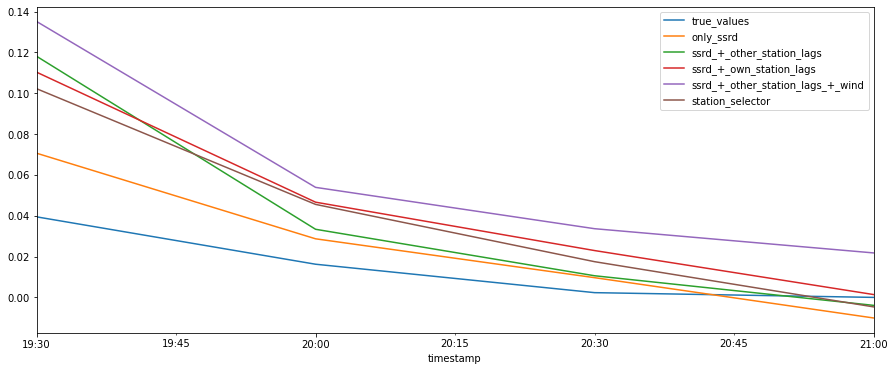

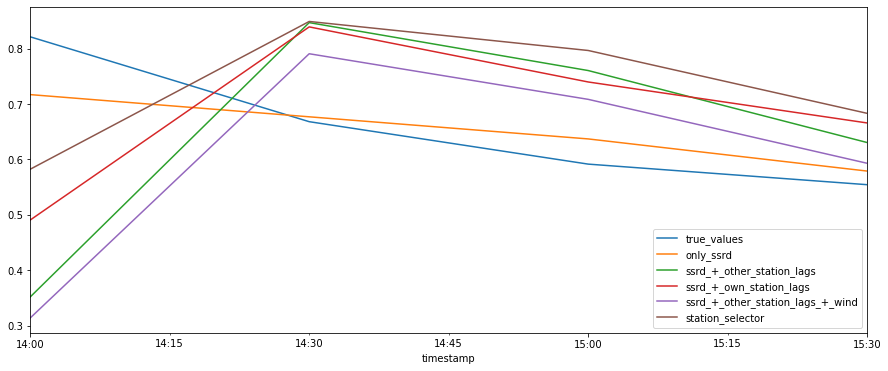

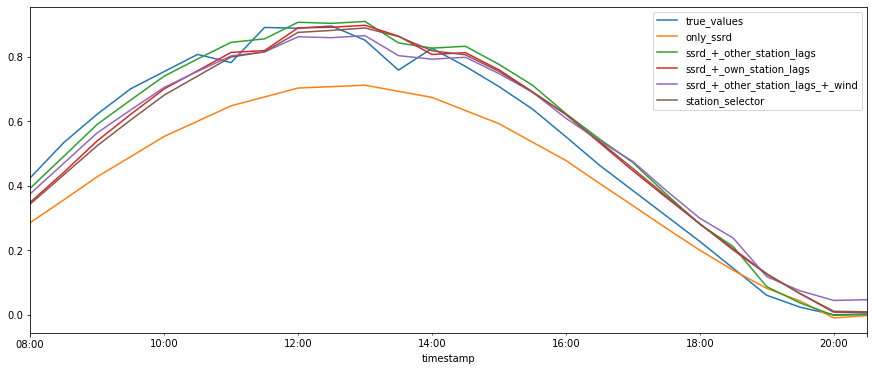

...

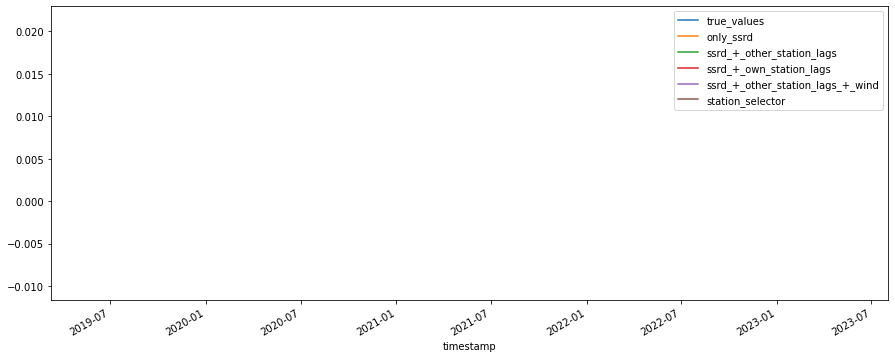

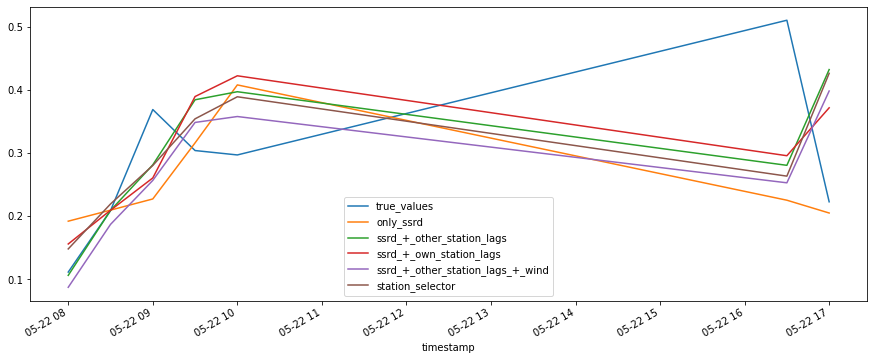

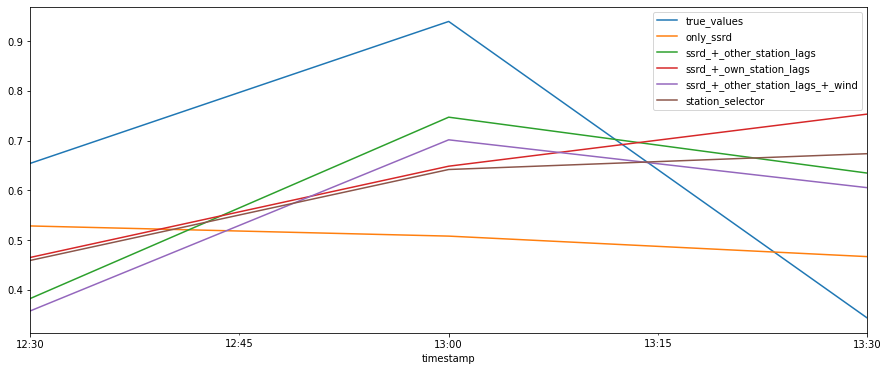

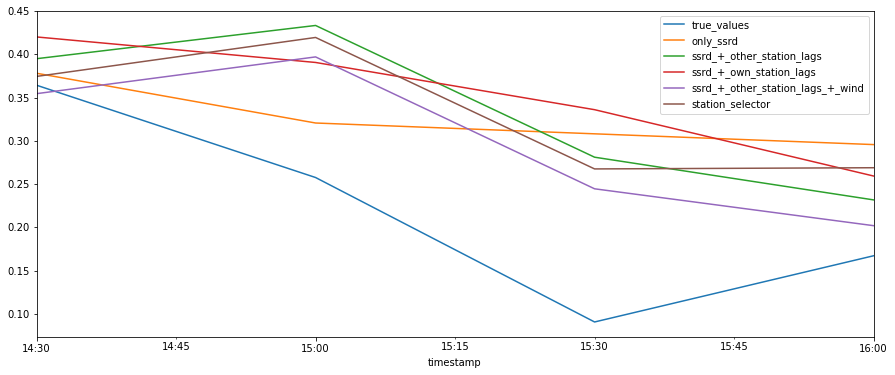

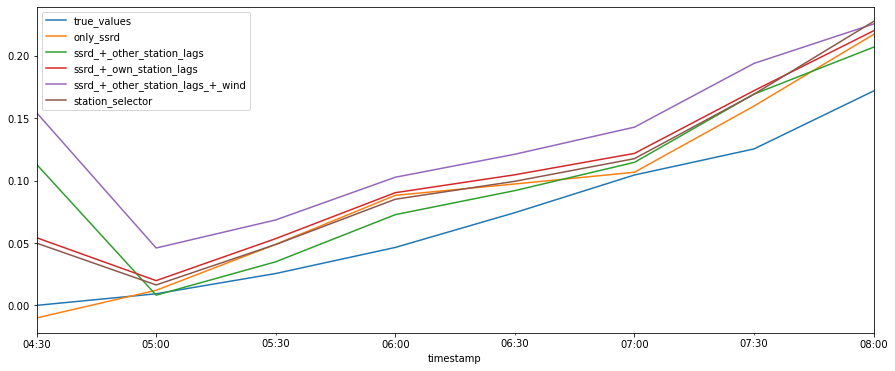

In [181]:
df_compare.groupby(df_compare.index.date).plot(figsize=(15,6))

<AxesSubplot:>

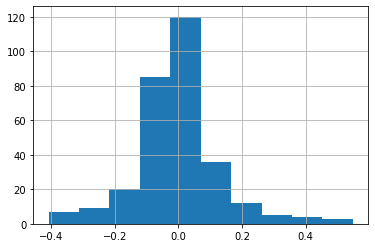

In [190]:
((df_compare["true_values"] - df_compare["station_selector"])).hist()

<AxesSubplot:>

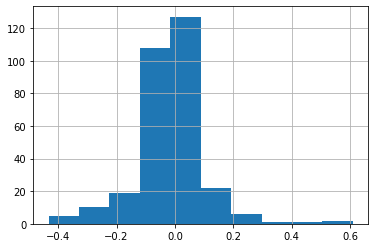

In [191]:
(df_compare["true_values"] - df_compare["ssrd_+_other_station_lags"]).hist()

In [187]:
def error_dist(df_test):

    y = df_test.iloc[:,:1]
    mean = y.mean()

    dist_plots = {}

    for i in range(len(df_test.columns)-1):
        y_hat = df_test.iloc[:,i+1]

        errors = y - y_hat
        dist_plots[y_hat.name] = errors.hist()

    return dist_plots

5-25 14:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-25 15:00:00'}>,
         <AxesSubplot:title={'center':'2021-05-25 15:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-25 16:00:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 04:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 05:00:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 05:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 06:00:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 06:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 07:00:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 07:30:00'}>,
         <AxesSubplot:title={'center':'2021-05-31 08:00:00'}>,
         <AxesSubplot:title={'center':'true_values'}>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object),
 'station_selector': array([[<AxesSubplot:title={'center':'2020-06-16 09:30:00'}>,
         <AxesSubplot:title={'center':'2020-06-16 10:00:00'}>

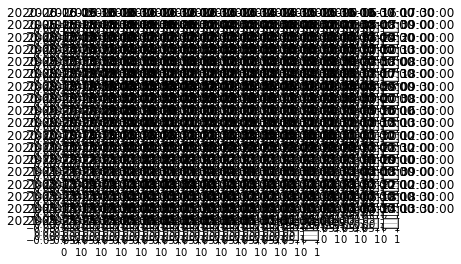

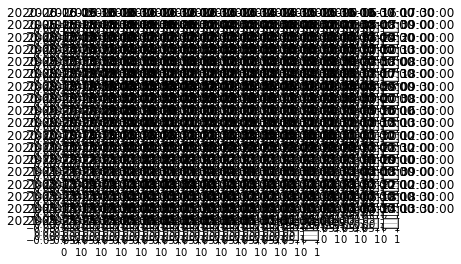

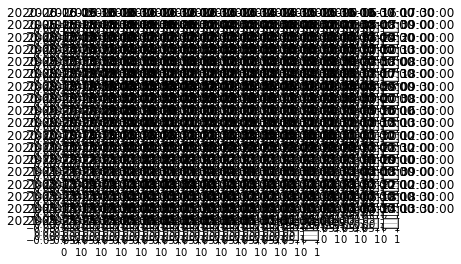

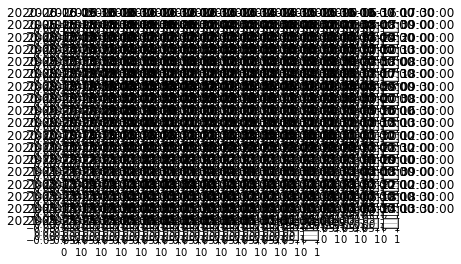

Error in callback <function flush_figures at 0x7f9fadfd6550> (for post_execute):


KeyboardInterrupt: 

In [188]:
error_dist(df_compare)